<a href="https://colab.research.google.com/github/pixelwizard2/Project.AI--ColorQuest---AI-s-Journey-in-Reviving-WWII-Imagery/blob/main/ColorQuest_code_(English).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Project.AI. ColorQuest - AI's Journey in Reviving WWII Imagery.

## Restoration of World War II Black and White Photographs_Attempts at Color Recovery through GAN Model Implementation.

## 1. Google Drive mount

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 2. Load data file (for checking)

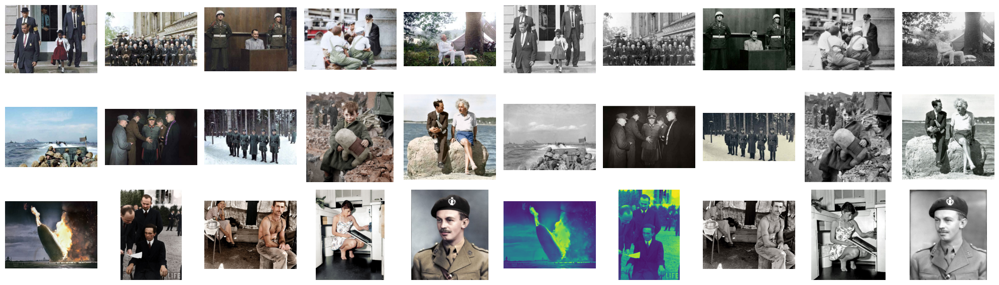

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

folder_path1 = '/content/drive/My Drive/image_dataset(1)/color_images'
folder_path2 = '/content/drive/My Drive/image_dataset(1)/gray_images'

# Image file list
image_files1 = [os.path.join(folder_path1, f) for f in os.listdir(folder_path1) if os.path.isfile(os.path.join(folder_path1, f))]
image_files2 = [os.path.join(folder_path2, f) for f in os.listdir(folder_path2) if os.path.isfile(os.path.join(folder_path2, f))]

# Preparing for image display
fig, axes = plt.subplots(3, 10, figsize=(20, 6))  # Create a subplot with 3 rows and 10 columns

# Arrange folders left and right
for i, file in enumerate(image_files1):
    img = mpimg.imread(file)
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    ax.axis('off')

for i, file in enumerate(image_files2):
    img = mpimg.imread(file)
    ax = axes[i // 5, i % 5 + 5]
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

## 3. Image loading and preprocessing

In [ ]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, UpSampling2D, MaxPooling2D, Input, concatenate, Dropout, BatchNormalization

# Data loading and preprocessing
def load_images(folder_path, color_mode, image_size=(256, 256)):
    images = []
    for filename in os.listdir(folder_path):
        if color_mode == 'color':
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_COLOR)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)
            img = np.expand_dims(img, axis=-1)
        img = cv2.resize(img, image_size)
        img = img / 255.0
        images.append(img)
    return np.stack(images)

folder_path1 = '/content/drive/My Drive/image_dataset(1)/color_images'
folder_path2 = '/content/drive/My Drive/image_dataset(1)/gray_images'

color_images = load_images(folder_path1, color_mode='color')
gray_images = load_images(folder_path2, color_mode='gray')

# Data Splitting
X_train, X_test, y_train, y_test = train_test_split(gray_images, color_images, test_size=0.1, random_state=42)

# Set black and white image input type when creating model
input_shape = (256, 256, 1)

## 4. Design and build deep learning models (4 types)

In [ ]:
# Design and build various deep learning models
def build_simple_cnn(input_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))
    return model

def build_deep_cnn(input_shape):
    model = Sequential()
    model.add(Conv2D(64, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(UpSampling2D((2, 2)))    # Apply upsampling only once
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))
    return model

def build_autoencoder(input_shape):
    input_img = Input(shape=input_shape)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
    autoencoder = Model(input_img, x)
    return autoencoder

def build_unet(input_shape):
    inputs = Input(input_shape)

    # Encoding path
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    # Bottleneck
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = Dropout(0.5)(conv3)

    # Decoding path
    up4 = concatenate([UpSampling2D(size=(2, 2))(conv3), conv2], axis=3)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(up4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = Dropout(0.5)(conv4)

    up5 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv1], axis=3)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = Dropout(0.25)(conv5)

    # Output layer
    conv6 = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(conv5)

    unet = Model(inputs=[inputs], outputs=[conv6])
    return unet

## 5. Model creation and compilation


In [ ]:
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Mapping model names and corresponding functions in dictionary
model_builders = {
    'simple_cnn': build_simple_cnn,
    'deep_cnn': build_deep_cnn,
    'autoencoder': build_autoencoder,
    'unet': build_unet,
}

# Add channel dimension to X_train and X_test
X_train = X_train.reshape(X_train.shape[0], 256, 256, 1)
X_test = X_test.reshape(X_test.shape[0], 256, 256, 1)

# Define input type
input_shape = X_train.shape[1:]

# Create and compile all models
models = {}
for name, builder in model_builders.items():
    print(f"Building and compiling the {name} model...")
    model = builder(input_shape)
    model.compile(optimizer='adam', loss='mean_squared_error')
    models[name] = model
    model.summary()

Building and compiling the simple_cnn model...
Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 256, 256, 32)      320       
                                                                 
 conv2d_59 (Conv2D)          (None, 256, 256, 3)       867       
                                                                 
Total params: 1187 (4.64 KB)
Trainable params: 1187 (4.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Building and compiling the deep_cnn model...
Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_60 (Conv2D)          (None, 256, 256, 64)      640       
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 12

## 6. Model training and performance evaluation

Training simple_cnn...
Epoch 1/10
11/11 [==============================] - 1s 23ms/step - loss: 0.6926 - accuracy: 0.4419 - val_loss: 0.6823 - val_accuracy: 0.4137
Epoch 2/10
11/11 [==============================] - 0s 9ms/step - loss: 0.6816 - accuracy: 0.4788 - val_loss: 0.6721 - val_accuracy: 0.4304
Epoch 3/10
11/11 [==============================] - 0s 7ms/step - loss: 0.6742 - accuracy: 0.4982 - val_loss: 0.6584 - val_accuracy: 0.4275
Epoch 4/10
11/11 [==============================] - 0s 7ms/step - loss: 0.6640 - accuracy: 0.4880 - val_loss: 0.6412 - val_accuracy: 0.4217
Epoch 5/10
11/11 [==============================] - 0s 7ms/step - loss: 0.6520 - accuracy: 0.4850 - val_loss: 0.6178 - val_accuracy: 0.4135
Epoch 6/10
11/11 [==============================] - 0s 7ms/step - loss: 0.6362 - accuracy: 0.4712 - val_loss: 0.5946 - val_accuracy: 0.4162
Epoch 7/10
11/11 [==============================] - 0s 7ms/step - loss: 0.6204 - accuracy: 0.4423 - val_loss: 0.5694 - val_accuracy: 0.3

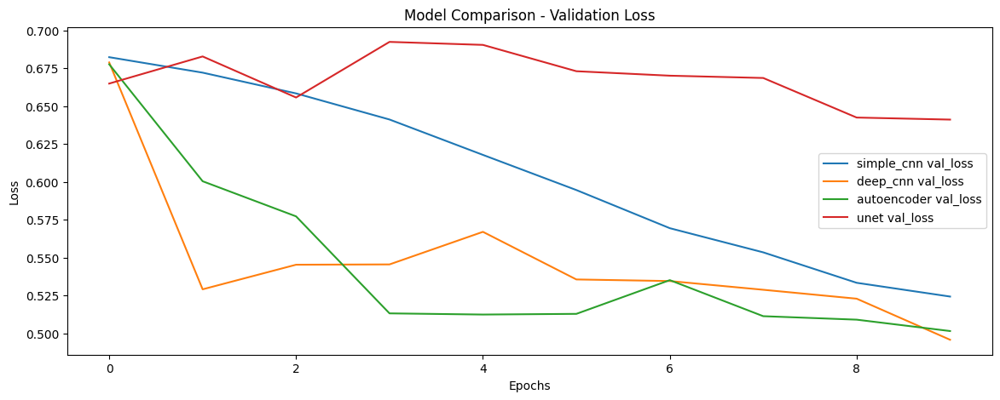

In [ ]:
# Model training and performance evaluation
history_dict = {}
for name, model in models.items():
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

    print(f"Training {name}...")
    history = model.fit(X_train, y_train, epochs=10, batch_size=1, validation_split=0.1)
    history_dict[name] = history
    model.save(f"{name}_model.h5")

# Loss graph for performance comparison by model
plt.figure(figsize=(14, 5))
for name, history in history_dict.items():
    val_loss = history.history['val_loss']
    plt.plot(val_loss, label=f'{name} val_loss')

plt.title('Model Comparison - Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

## 7. Download model

In [ ]:
from google.colab import files

# Iterate through all models and download each one
for name in models.keys():
    file_name = f"{name}_model.h5"
    files.download(file_name)

In [ ]:
# Move the saved model file to Google Drive
for name in models.keys():
    file_name = f"{name}_model.h5"
    destination_path = f"/content/drive/My Drive/{file_name}"
    !cp {file_name} {destination_path}

cp: target 'Drive/simple_cnn_model.h5' is not a directory
cp: target 'Drive/deep_cnn_model.h5' is not a directory
cp: target 'Drive/autoencoder_model.h5' is not a directory
cp: target 'Drive/unet_model.h5' is not a directory


## 8. Upload model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from tensorflow.keras.models import load_model
import numpy as np
import cv2

# List of models to loa
model_names = ['simple_cnn', 'deep_cnn', 'autoencoder', 'unet']

# Load each model
loaded_models = {}
for name in model_names:
    file_path = f"/content/drive/MyDrive/{name}_model.h5"
    loaded_models[name] = load_model(file_path)

for name, model in loaded_models.items():   # Code to check whether the model has been loaded properly
    print(f"{name} model is loaded.")

Mounted at /content/drive
simple_cnn model is loaded.
deep_cnn model is loaded.
autoencoder model is loaded.
unet model is loaded.


## 9. Model Operation (black and white photo conversion)

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def load_and_process_image(file_path, color_mode='rgb', image_size=(256, 256)):
    # Load image
    img = load_img(file_path, color_mode=color_mode, target_size=image_size)
    # Convert image to numpy array
    img = img_to_array(img)
    # Divide by 255 to normalize
    img = img / 255.0
    return img

# test image path
test_image_paths = ['/content/drive/MyDrive/test_photo_before1.jpg',
                    '/content/drive/MyDrive/test_photo_before2.jpg']

for path in test_image_paths:
    # Load and process images
    test_image = load_and_process_image(path, color_mode='grayscale')
    test_image = np.expand_dims(test_image, axis=0)  # Add batch dimension

    for name, model in loaded_models.items():
        predicted = model.predict(test_image)
        predicted = np.squeeze(predicted) * 255.0  # Remove and rebalance batch dimensions
        output_path = path.replace('before', f'after_{name}')
        cv2.imwrite(output_path, cv2.cvtColor(predicted.astype(np.uint8), cv2.COLOR_RGB2BGR))
        print(f"Output saved to {output_path}")

print("All models have been trained and evaluated.")

1/1 [==============================] - 1s 889ms/step
Output saved to /content/drive/MyDrive/test_photo_after_simple_cnn1.jpg
1/1 [==============================] - 2s 2s/step
Output saved to /content/drive/MyDrive/test_photo_after_deep_cnn1.jpg
1/1 [==============================] - 0s 350ms/step
Output saved to /content/drive/MyDrive/test_photo_after_autoencoder1.jpg
1/1 [==============================] - 1s 1s/step
Output saved to /content/drive/MyDrive/test_photo_after_unet1.jpg
1/1 [==============================] - 0s 37ms/step
Output saved to /content/drive/MyDrive/test_photo_after_simple_cnn2.jpg
1/1 [==============================] - 1s 990ms/step
Output saved to /content/drive/MyDrive/test_photo_after_deep_cnn2.jpg
1/1 [==============================] - 0s 288ms/step
Output saved to /content/drive/MyDrive/test_photo_after_autoencoder2.jpg
1/1 [==============================] - 1s 990ms/step
Output saved to /content/drive/MyDrive/test_photo_after_unet2.jpg
All models have been 

## 10. Model Implementation (color photo output)

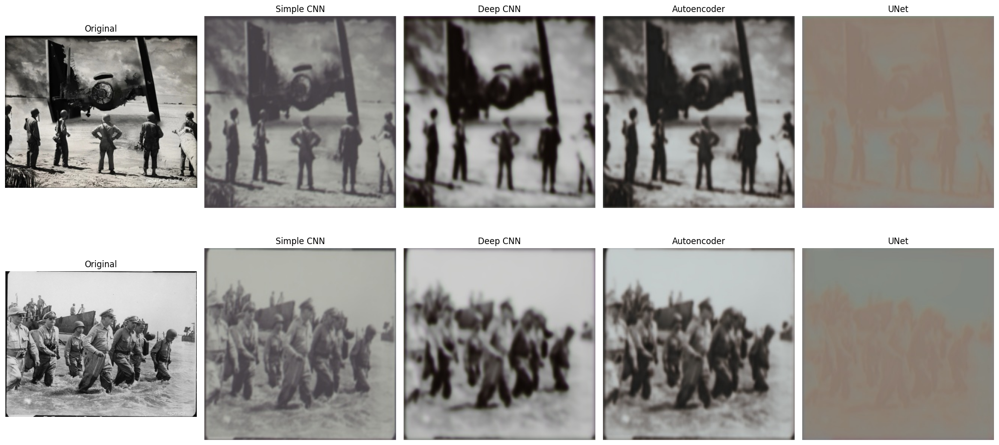

In [ ]:
import matplotlib.pyplot as plt
import cv2

# Resulting image path
result_paths = [
    '/content/drive/MyDrive/test_photo_before1.jpg', #Original Image 1
    '/content/drive/MyDrive/test_photo_after_simple_cnn1.jpg',
    '/content/drive/MyDrive/test_photo_after_deep_cnn1.jpg',
    '/content/drive/MyDrive/test_photo_after_autoencoder1.jpg',
    '/content/drive/MyDrive/test_photo_after_unet1.jpg',
    '/content/drive/MyDrive/test_photo_before2.jpg', #Original Image 2
    '/content/drive/MyDrive/test_photo_after_simple_cnn2.jpg',
    '/content/drive/MyDrive/test_photo_after_deep_cnn2.jpg',
    '/content/drive/MyDrive/test_photo_after_autoencoder2.jpg',
    '/content/drive/MyDrive/test_photo_after_unet2.jpg'
]

model_names = ['Original', 'Simple CNN', 'Deep CNN', 'Autoencoder', 'UNet']

# Image output settings
n_rows = 2
n_cols = 5
figsize_width = 20
figsize_height = 10

# Image output
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(figsize_width, figsize_height))
axes = axes.ravel()

for i, path in enumerate(result_paths):
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # RGB conversion for OpenCV

    # Display image and model name
    axes[i].imshow(image)
    axes[i].set_title(model_names[i % n_cols])
    axes[i].axis('off')

plt.tight_layout()
plt.show()

## Re-Start. Load data file (for checking)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


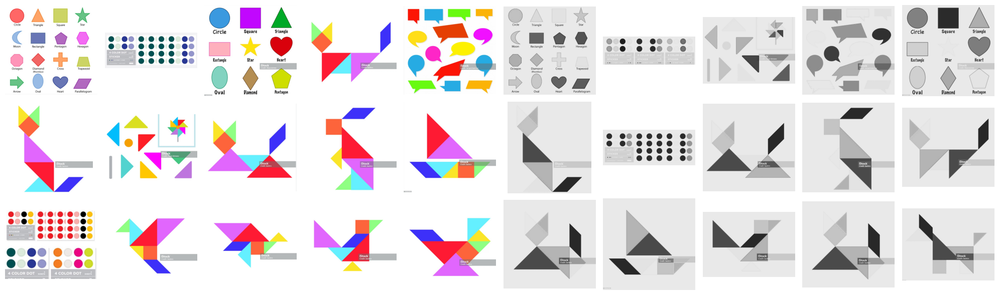

In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from google.colab import drive
drive.mount('/content/drive')

folder_path3 = '/content/drive/My Drive/image_dataset(2)/color_images'
folder_path4 = '/content/drive/My Drive/image_dataset(2)/gray_images'

image_files3 = [os.path.join(folder_path3, f) for f in os.listdir(folder_path3) if os.path.isfile(os.path.join(folder_path3, f))]
image_files4 = [os.path.join(folder_path4, f) for f in os.listdir(folder_path4) if os.path.isfile(os.path.join(folder_path4, f))]

fig, axes = plt.subplots(3, 10, figsize=(20, 6))

for i, file in enumerate(image_files3[:15]):
    img = mpimg.imread(file)
    ax = axes[i // 5, i % 5]
    ax.imshow(img)
    ax.axis('off')

for i, file in enumerate(image_files4[:15]):
    img = mpimg.imread(file)
    ax = axes[i // 5, i % 5 + 5]
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

## 11. Building a new dataset & model (front development process : Same as above)

In [ ]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split

from google.colab import drive
drive.mount('/content/drive')

def load_images(folder_path, color_mode, image_size=(256, 256)):
    images = []
    for filename in os.listdir(folder_path):
        if color_mode == 'color':
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_COLOR)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        else:
            img = cv2.imread(os.path.join(folder_path, filename), cv2.IMREAD_GRAYSCALE)
            img = np.expand_dims(img, axis=-1)
        img = cv2.resize(img, image_size)
        img = img / 255.0
        images.append(img)
    return np.array(images)

folder_path3 = '/content/drive/My Drive/image_dataset(2)/color_images'
folder_path4 = '/content/drive/My Drive/image_dataset(2)/gray_images'

color_images = load_images(folder_path3, color_mode='color')
gray_images = load_images(folder_path4, color_mode='gray')

gray_images_with_channel = np.expand_dims(gray_images, axis=-1)

gray_images_3ch = np.repeat(gray_images_with_channel, 3, axis=3)

X_train, X_test, y_train, y_test = train_test_split(gray_images_3ch, color_images, test_size=0.1, random_state=42)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 12. Design and construction of 4 models + additional GAN model

In [ ]:
import numpy as np
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, UpSampling2D, MaxPooling2D, Input, concatenate, Dropout, BatchNormalization, LeakyReLU, Dense, Flatten, Reshape

def build_simple_cnn(input_shape):
    model = Sequential()
    model.add(Conv2D(32, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))
    return model

def build_deep_cnn(input_shape):
    model = Sequential()
    model.add(Conv2D(64, (3, 3), input_shape=input_shape, activation='relu', padding='same'))
    model.add(MaxPooling2D((2, 2), padding='same'))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(UpSampling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(Conv2D(3, (3, 3), activation='sigmoid', padding='same'))
    return model


def build_autoencoder(input_shape):
    input_img = Input(shape=input_shape)
    x = Conv2D(256, (3, 3), activation='relu', padding='same')(input_img)
    x = MaxPooling2D((2, 2), padding='same')(x)
    x = Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)
    autoencoder = Model(input_img, x)
    return autoencoder

def build_unet(input_shape):
    inputs = Input(input_shape)

    # Encoding path
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
    pool1 = Dropout(0.25)(pool1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    pool2 = Dropout(0.5)(pool2)

    # Bottleneck
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = Dropout(0.5)(conv3)

    # Decoding path
    up4 = concatenate([UpSampling2D(size=(2, 2))(conv3), conv2], axis=3)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(up4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = Dropout(0.5)(conv4)

    up5 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv1], axis=3)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(up5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = Dropout(0.25)(conv5)

    # Output layer
    conv6 = Conv2D(3, (3, 3), activation='sigmoid', padding='same')(conv5)

    unet = Model(inputs=[inputs], outputs=[conv6])
    return unet

In [ ]:
# Define the generator model of GAN.
def build_generator(input_shape):
    model = Sequential()
    # The first Dense layer is set to create a tensor of size 256x256
    model.add(Dense(256 * 256, activation="relu", input_shape=input_shape))
    model.add(Reshape((256, 256, 1)))

   # Adjust the resolution of the image by adding a Conv2D layer
    model.add(Conv2D(128, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(64, kernel_size=3, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    model.add(Conv2D(3, kernel_size=3, padding="same", activation='tanh'))

    return model

# Define the discriminator model of GAN.
def build_discriminator(image_shape):
    model = Sequential()
    model.add(Conv2D(64, kernel_size=3, strides=2, input_shape=(256, 256, 3), padding="same"))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))

    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))
    return model

# GAN model
def build_gan(generator, discriminator):
    model = Sequential()
    # Set the discriminator part not to be learned
    discriminator.trainable = False
    # Connect the generator and discriminator models
    model.add(generator)
    model.add(discriminator)
    return model

## 13. Create and compile 5 models

In [ ]:
from tensorflow.keras.layers import ZeroPadding2D

# Build and compile the model
input_shape = (100,)  # Dimension of latent space vector
image_shape = (256, 256, 3)   # Shape of image

# Build the constructor and discriminator
generator = build_generator(input_shape=(100,))
discriminator = build_discriminator(image_shape=(256, 256, 3))

# Compile the discriminator
discriminator.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5), metrics=['accuracy'])

# Compile GAN model
gan = build_gan(generator, discriminator)
gan.compile(loss='binary_crossentropy', optimizer=Adam(0.0002, 0.5))

# Load data
folder_path3 = '/content/drive/My Drive/image_dataset(2)/color_images'
folder_path4 = '/content/drive/My Drive/image_dataset(2)/gray_images'
color_images = load_images(folder_path3, color_mode='color')
gray_images = load_images(folder_path4, color_mode='gray')

# Data Splitting
X_train, X_test, y_train, y_test = train_test_split(gray_images, color_images, test_size=0.1, random_state=42)

# Add channel dimension
X_train = X_train.reshape(X_train.shape[0], 256, 256, 1)
X_test = X_test.reshape(X_test.shape[0], 256, 256, 1)

# Build and compile models, including existing models and GAN
models = {
    'simple_cnn': build_simple_cnn(X_train.shape[1:]),
    'deep_cnn': build_deep_cnn(X_train.shape[1:]),
    'autoencoder': build_autoencoder(X_train.shape[1:]),
    'unet': build_unet(X_train.shape[1:]),
    'gan_generator': generator,
    'gan_discriminator': discriminator,
    'gan': gan
}

# Compile
models['simple_cnn'].compile(optimizer='adam', loss='mean_squared_error')
models['deep_cnn'].compile(optimizer='adam', loss='mean_squared_error')
models['autoencoder'].compile(optimizer='adam', loss='mean_squared_error')
models['unet'].compile(optimizer='adam', loss='mean_squared_error')

# Model summary output
for model_name in models:
    if model_name not in ['gan_generator', 'gan_discriminator', 'gan']:
        models[model_name].summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 256, 256, 32)      320       
                                                                 
 conv2d_8 (Conv2D)           (None, 256, 256, 3)       867       
                                                                 
Total params: 1187 (4.64 KB)
Trainable params: 1187 (4.64 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 256, 256, 64)      640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)      0         
 D)                                                              


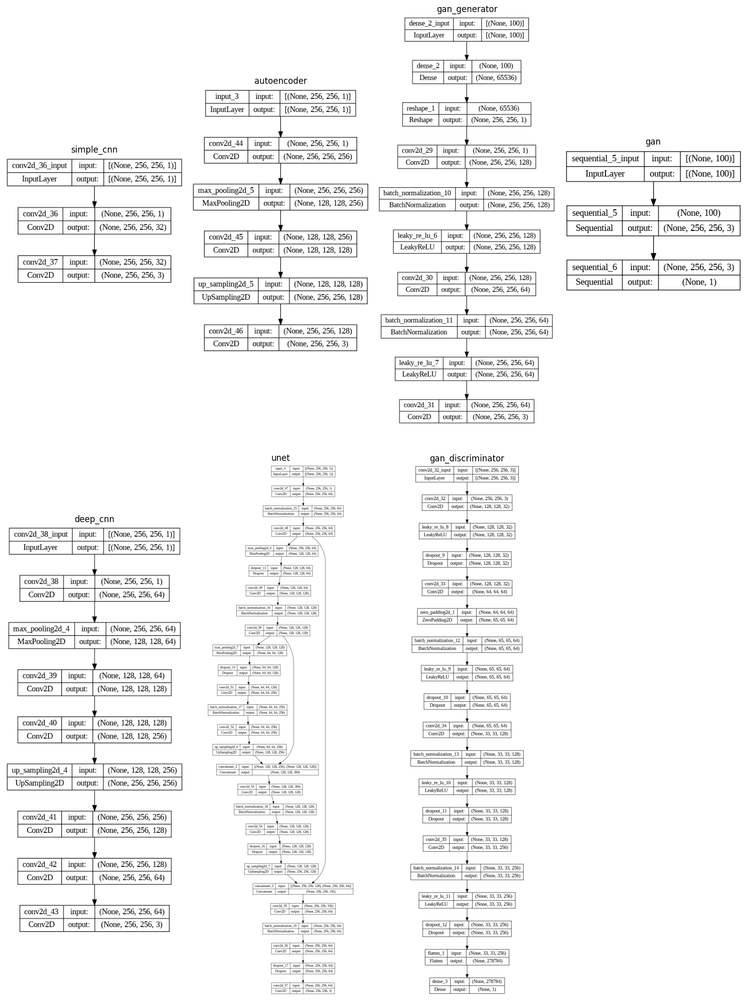

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.utils import plot_model

# Save the model diagram and display it as a grid
n_models = len(models)
fig, axs = plt.subplots(2, n_models // 2 + n_models % 2, figsize=(15, n_models * 3))

model_names = list(models.keys())
for i, model_name in enumerate(model_names):
    file_path = f'{model_name}_model.png'
    plot_model(models[model_name], to_file=file_path, show_shapes=True, show_layer_names=True)
    img = mpimg.imread(file_path)
    axs[i % 2, i // 2].imshow(img)
    axs[i % 2, i // 2].axis('off')
    axs[i % 2, i // 2].set_title(model_name)

# Hide empty subplots
if n_models % 2 != 0:
    axs[1, n_models // 2].axis('off')

plt.tight_layout()
plt.show()

## 13. Retrain 4 models and evaluate performance

In [ ]:
import matplotlib.pyplot as plt

# Model training and performance evaluation
history_dict = {}
for name, model in models.items():
    if 'gan' not in name:  # Exclude GAN model
        print(f"Training {name}...")

        model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
        history = model.fit(X_train, y_train, epochs=10, batch_size=1, validation_split=0.1)
        history_dict[name] = history
        model.save(f"{name}_model.h5")

Training simple_cnn...
Epoch 1/10
32/32 [==============================] - 1s 11ms/step - loss: 0.3599 - accuracy: 0.7650 - val_loss: 0.3775 - val_accuracy: 0.7954
Epoch 2/10
32/32 [==============================] - 0s 6ms/step - loss: 0.3596 - accuracy: 0.7650 - val_loss: 0.3764 - val_accuracy: 0.7954
Epoch 3/10
32/32 [==============================] - 0s 5ms/step - loss: 0.3610 - accuracy: 0.7650 - val_loss: 0.3763 - val_accuracy: 0.7954
Epoch 4/10
32/32 [==============================] - 0s 5ms/step - loss: 0.3631 - accuracy: 0.7650 - val_loss: 0.3762 - val_accuracy: 0.7954
Epoch 5/10
32/32 [==============================] - 0s 5ms/step - loss: 0.3610 - accuracy: 0.7650 - val_loss: 0.3763 - val_accuracy: 0.7954
Epoch 6/10
32/32 [==============================] - 0s 5ms/step - loss: 0.3583 - accuracy: 0.7650 - val_loss: 0.3780 - val_accuracy: 0.7954
Epoch 7/10
32/32 [==============================] - 0s 5ms/step - loss: 0.3597 - accuracy: 0.7650 - val_loss: 0.3752 - val_accuracy: 0.7

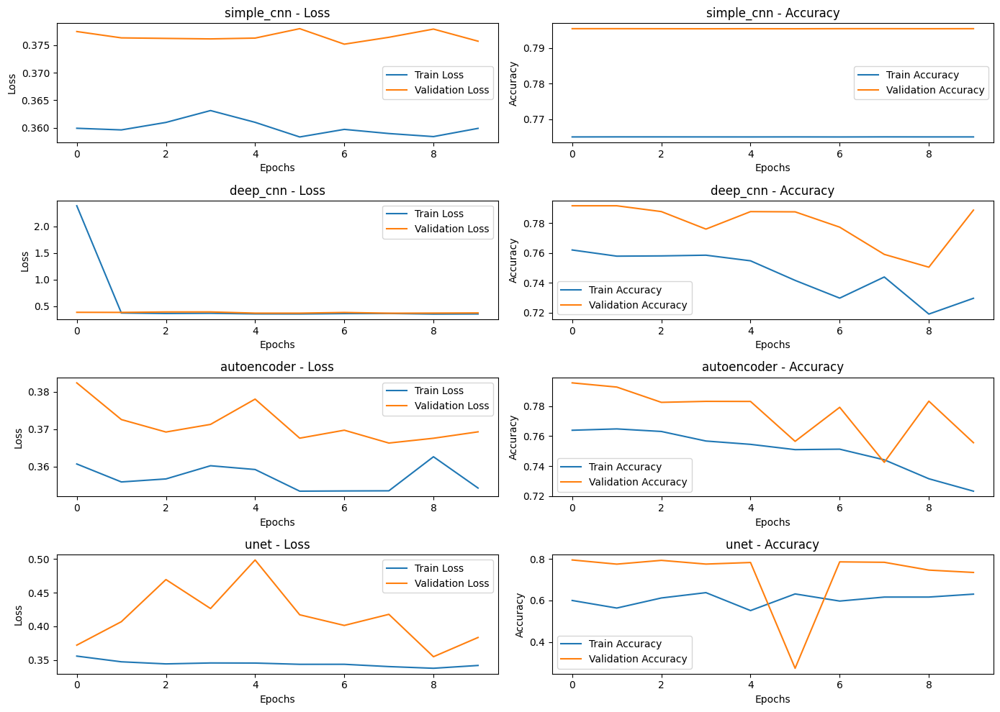

In [ ]:
# Set up subplot to display all graphs
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(14, 10))

# Generate loss and accuracy graphs for each model
for i, (name, history) in enumerate(history_dict.items()):
    row = i // 2
    col = i % 2

    # Loss graph
    axes[i, 0].plot(history.history['loss'], label='Train Loss')
    axes[i, 0].plot(history.history['val_loss'], label='Validation Loss')
    axes[i, 0].set_title(f'{name} - Loss')
    axes[i, 0].set_xlabel('Epochs')
    axes[i, 0].set_ylabel('Loss')
    axes[i, 0].legend()

    # Accuracy graph
    if 'acc' in history.history:
        train_acc_key = 'acc'
        val_acc_key = 'val_acc'
    else:
        train_acc_key = 'accuracy'
        val_acc_key = 'val_accuracy'

    axes[i, 1].plot(history.history[train_acc_key], label='Train Accuracy')
    axes[i, 1].plot(history.history[val_acc_key], label='Validation Accuracy')
    axes[i, 1].set_title(f'{name} - Accuracy')
    axes[i, 1].set_xlabel('Epochs')
    axes[i, 1].set_ylabel('Accuracy')
    axes[i, 1].legend()

plt.tight_layout()
plt.show()

## 14. GAN model training and performance evaluation (step-by-step sequential adjustment of epochs)

1/1 [==============================] - 6s 6s/step
0 [D loss: 0.678126, acc.: 45.31%] [G loss: 0.668146]
1/1 [==============================] - 2s 2s/step


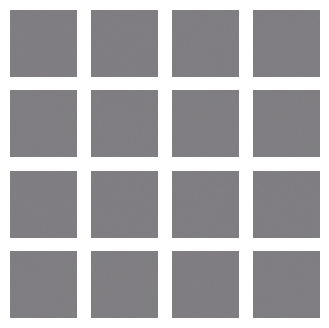

1/1 [==============================] - 0s 22ms/step


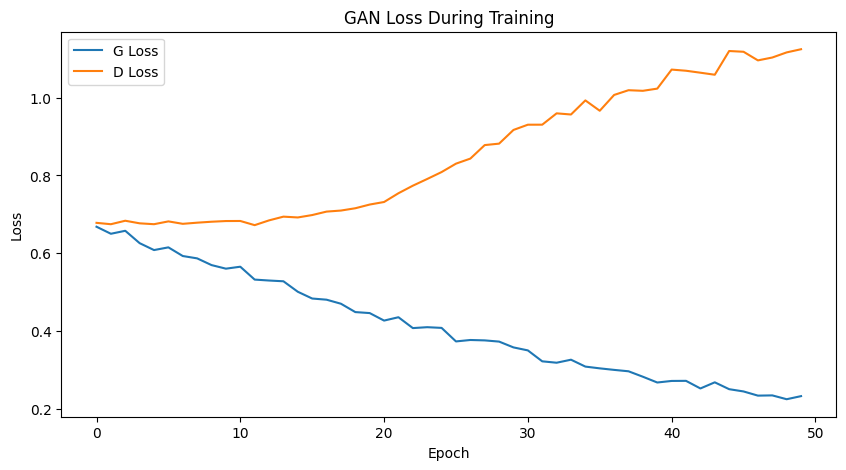

1/1 [==============================] - 0s 28ms/step


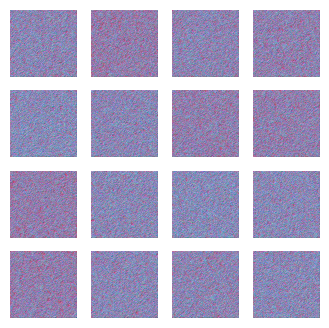

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.optimizers import Adam

def train_gan(generator, discriminator, gan, X_train, epochs, batch_size, sample_interval):
    # Optimizer settings
    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    gan.compile(loss='binary_crossentropy', optimizer=optimizer)

    # Prepare labels for real and fake images
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        # Real image sampling
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        # Create fake image
        noise = np.random.normal(0, 1, (batch_size, 100))
        fake_imgs = generator.predict(noise)

        # Discriminator training
        d_loss_real = discriminator.train_on_batch(real_imgs, valid)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # constructor training
        noise = np.random.normal(0, 1, (batch_size, 100))
        g_loss = gan.train_on_batch(noise, valid)

        # Output progress
        if epoch % sample_interval == 0:
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
            sample_images(epoch, generator)

        # Save history
        g_loss_history.append(g_loss)
        d_loss_history.append(d_loss[0])

    # Visualize loss graph
    plt.figure(figsize=(10,5))
    plt.plot(g_loss_history, label='G Loss')
    plt.plot(d_loss_history, label='D Loss')
    plt.title('GAN Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Check the final result
    sample_images("Final", generator)

def sample_images(epoch, generator, image_grid_rows=4, image_grid_columns=4):
    # Random noise sampling and image generation
    noise = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, 100))
    gen_imgs = generator.predict(noise)

    # Adjust the range of image pixel values
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Image visualization
    fig, axs = plt.subplots(image_grid_rows, image_grid_columns, figsize=(4, 4))
    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            axs[i, j].imshow(gen_imgs[cnt, :, :, :], cmap=None)
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

# GAN training call
train_gan(generator, discriminator, gan, gray_images_3ch, epochs=50, batch_size=32, sample_interval=1000)   # epochs=50

### Adjust as follows to obtain the ideal GAN training graph.

1) Improve the performance of the optimizer by adjusting the learning rate and beta1 values.  
2) Increase training stability by adjusting batch size.  
3) Reduce sampling interval to check learning progress more frequently.  
4) Monitor your model's progress with regular output from training.  

2/2 [==============================] - 0s 139ms/step
0 [D loss: 2.760708, acc.: 41.41%] [G loss: 0.007561]
1/1 [==============================] - 0s 28ms/step


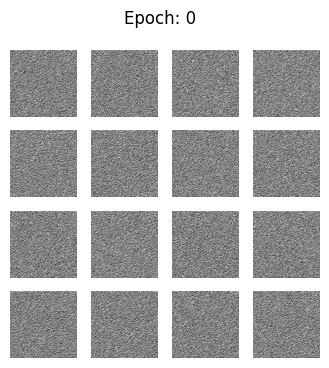

2/2 [==============================] - 0s 114ms/step
50 [D loss: 2.945158, acc.: 39.84%] [G loss: 0.005482]
1/1 [==============================] - 0s 17ms/step


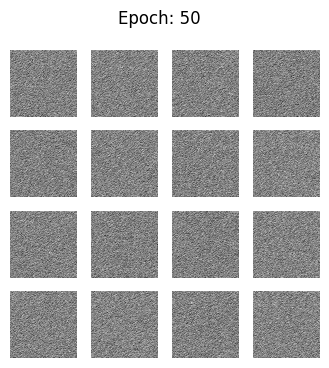

2/2 [==============================] - 0s 115ms/step
100 [D loss: 3.091205, acc.: 34.38%] [G loss: 0.004098]
1/1 [==============================] - 0s 25ms/step


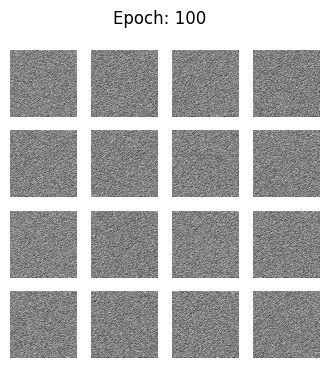

2/2 [==============================] - 0s 114ms/step
150 [D loss: 3.188332, acc.: 42.97%] [G loss: 0.003251]
1/1 [==============================] - 0s 17ms/step


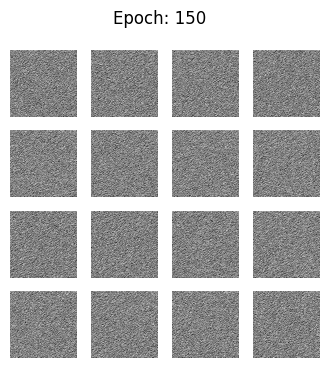

2/2 [==============================] - 0s 115ms/step
200 [D loss: 3.276867, acc.: 42.19%] [G loss: 0.002723]
1/1 [==============================] - 0s 16ms/step


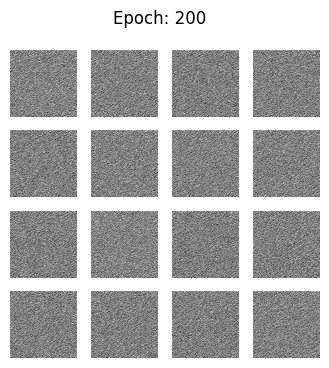

2/2 [==============================] - 0s 115ms/step


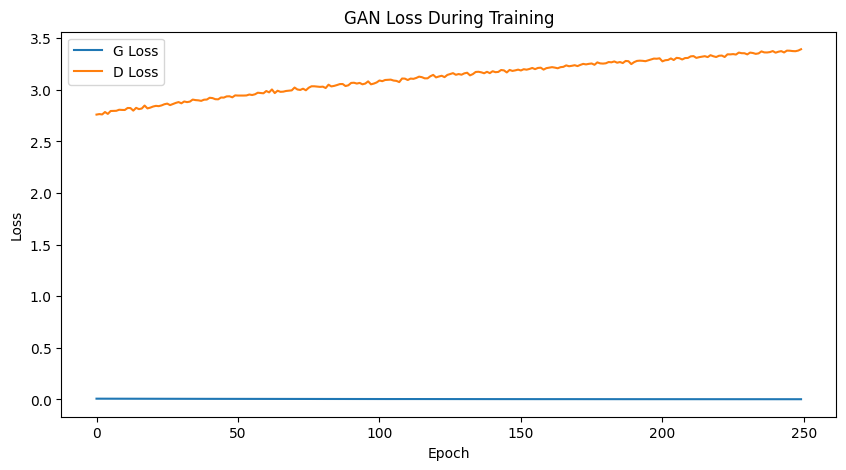

1/1 [==============================] - 0s 18ms/step


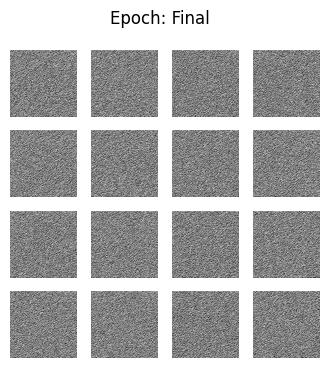

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import load_model

def train_gan(generator, discriminator, gan, X_train, epochs, batch_size, sample_interval):
    # Optimizer settings
    optimizer = Adam(learning_rate=0.0001, beta_1=0.5)  # Adjust learning rate
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    gan.compile(loss='binary_crossentropy', optimizer=optimizer)

    # Prepare labels for real and fake images
    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        # Real image sampling
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]

        # Create fake image
        noise = np.random.normal(0, 1, (batch_size, 100))
        fake_imgs = generator.predict(noise)

        # Discriminator training
        d_loss_real = discriminator.train_on_batch(real_imgs, valid)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        # constructor training
        noise = np.random.normal(0, 1, (batch_size, 100))
        g_loss = gan.train_on_batch(noise, valid)

        # Output progress
        if epoch % sample_interval == 0:
            print(f"{epoch} [D loss: {d_loss[0]:.6f}, acc.: {100*d_loss[1]:.2f}%] [G loss: {g_loss:.6f}]")
            sample_images(epoch, generator)

        # Save history
        g_loss_history.append(g_loss)
        d_loss_history.append(d_loss[0])

    # Visualize loss graph
    plt.figure(figsize=(10,5))
    plt.plot(g_loss_history, label='G Loss')
    plt.plot(d_loss_history, label='D Loss')
    plt.title('GAN Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # Check the final result
    sample_images("Final", generator)

def sample_images(epoch, generator, image_grid_rows=4, image_grid_columns=4):
    # Random noise sampling and image generation
    noise = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, 100))
    gen_imgs = generator.predict(noise)

    # Adjust the range of image pixel values
    gen_imgs = 0.5 * gen_imgs + 0.5

    # Image visualization
    fig, axs = plt.subplots(image_grid_rows, image_grid_columns, figsize=(4, 4), sharey=True, sharex=True)
    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            axs[i, j].imshow(gen_imgs[cnt, :, :, 0], cmap='gray')
            axs[i, j].axis('off')
            cnt += 1
    plt.suptitle(f"Epoch: {epoch}")
    plt.show()

# GAN training call
train_gan(generator, discriminator, gan, gray_images_3ch, epochs=250, batch_size=64, sample_interval=50)   # epochs=250, batch_size=64, sample_interval=50

1/1 [==============================] - 0s 16ms/step
0 [D loss: 1.124527, acc.: 37.50%] [G loss: 0.214613]
1/1 [==============================] - 0s 17ms/step


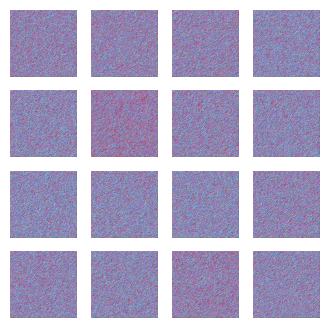

1/1 [==============================] - 0s 28ms/step


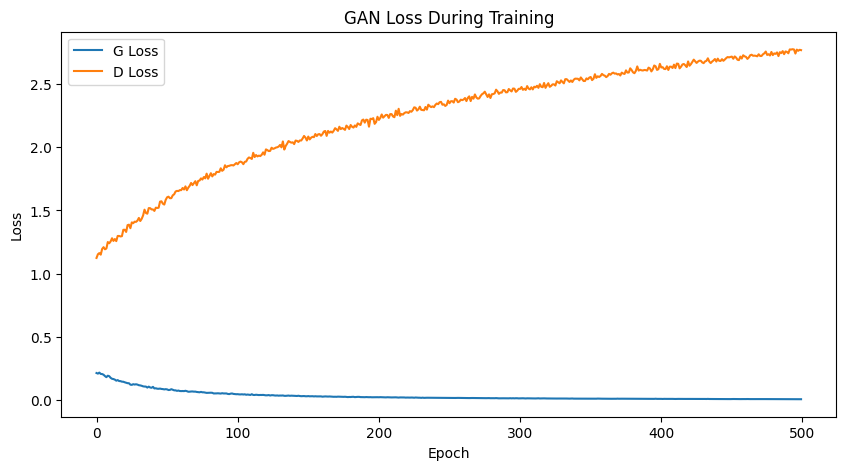

1/1 [==============================] - 0s 17ms/step


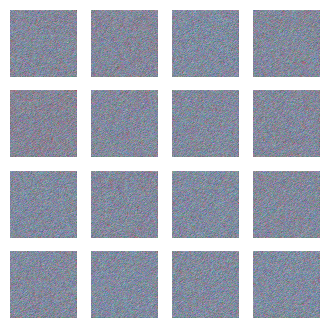

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.optimizers import Adam

def train_gan(generator, discriminator, gan, X_train, epochs, batch_size, sample_interval):

    optimizer = Adam(learning_rate=0.0002, beta_1=0.5)
    discriminator.compile(loss='binary_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    gan.compile(loss='binary_crossentropy', optimizer=optimizer)

    valid = np.ones((batch_size, 1))
    fake = np.zeros((batch_size, 1))

    g_loss_history = []
    d_loss_history = []

    for epoch in range(epochs):
        idx = np.random.randint(0, X_train.shape[0], batch_size)
        real_imgs = X_train[idx]
        noise = np.random.normal(0, 1, (batch_size, 100))
        fake_imgs = generator.predict(noise)

        d_loss_real = discriminator.train_on_batch(real_imgs, valid)
        d_loss_fake = discriminator.train_on_batch(fake_imgs, fake)
        d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

        noise = np.random.normal(0, 1, (batch_size, 100))
        g_loss = gan.train_on_batch(noise, valid)

        if epoch % sample_interval == 0:
            print("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))
            sample_images(epoch, generator)

        g_loss_history.append(g_loss)
        d_loss_history.append(d_loss[0])

    plt.figure(figsize=(10,5))
    plt.plot(g_loss_history, label='G Loss')
    plt.plot(d_loss_history, label='D Loss')
    plt.title('GAN Loss During Training')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    sample_images("Final", generator)

def sample_images(epoch, generator, image_grid_rows=4, image_grid_columns=4):
    noise = np.random.normal(0, 1, (image_grid_rows * image_grid_columns, 100))
    gen_imgs = generator.predict(noise)

    gen_imgs = 0.5 * gen_imgs + 0.5

    fig, axs = plt.subplots(image_grid_rows, image_grid_columns, figsize=(4, 4))
    cnt = 0
    for i in range(image_grid_rows):
        for j in range(image_grid_columns):
            axs[i, j].imshow(gen_imgs[cnt, :, :, :], cmap=None)
            axs[i, j].axis('off')
            cnt += 1
    plt.show()

train_gan(generator, discriminator, gan, gray_images_3ch, epochs=500, batch_size=32, sample_interval=1000)   # epochs=500

## 15. 모델 다운로드

In [ ]:
from tensorflow.keras.models import load_model
from google.colab import files

# GAN 모델 저장
generator.save("gan_generator.h5")

# 저장된 모델을 다운로드
files.download("gan_generator.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## 16. 모델 구현


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


1/1 [==============================] - 0s 19ms/step


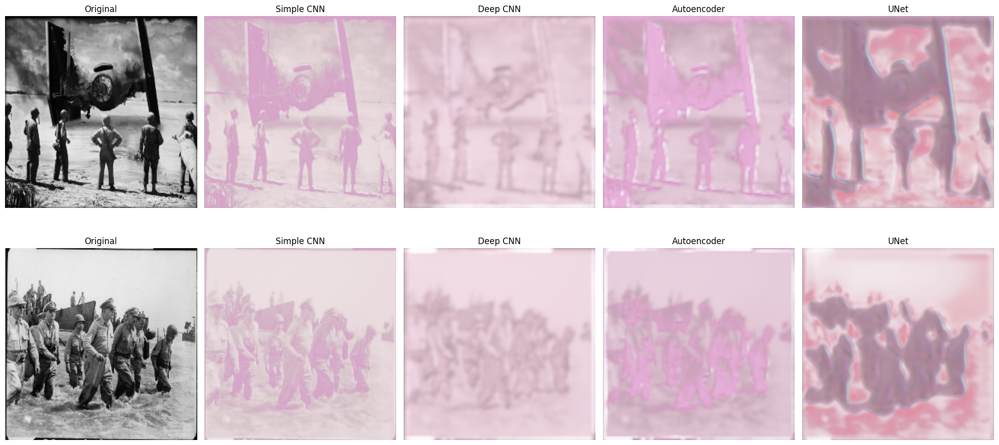

In [ ]:
from keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import cv2

# 모델 경로
models = {
    'Simple CNN': '/content/drive/MyDrive/simple_cnn_model.h5',
    'Deep CNN': '/content/drive/MyDrive/deep_cnn_model.h5',
    'Autoencoder': '/content/drive/MyDrive/autoencoder_model.h5',
    'UNet': '/content/drive/MyDrive/unet_model.h5'
}

# 테스트 이미지 경로
test_images = {
    'test_photo_before1': '/content/drive/MyDrive/test_photo_before1.jpg',
    'test_photo_before2': '/content/drive/MyDrive/test_photo_before2.jpg'
}

# 로드된 모델들
loaded_models = {name: load_model(model_path) for name, model_path in models.items()}

# 결과 이미지 출력 설정
n_rows = len(test_images)
n_cols = 1 + len(loaded_models) # 원본 이미지 + 모델의 수
figsize_width = 20
figsize_height = n_rows * 5

# 이미지 출력
fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(figsize_width, figsize_height))
axes = axes.ravel()

# 이미지를 모델이 요구하는 입력 형태로 전처리하는 함수
def preprocess_image(image_path, target_size=(256, 256)):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)  # 이미지를 흑백으로 변환
    image = cv2.resize(image, target_size)  # 이미지를 모델이 기대하는 크기로 리사이즈
    image = image / 255.0  # 픽셀 값을 0-1 범위로 정규화
    image = np.expand_dims(image, axis=-1)  # 차원을 추가하여 채널을 명시
    image = np.expand_dims(image, axis=0)  # 배치 차원을 추가
    return image

# 모델 적용 및 이미지 처리
for i, (test_img_name, test_img_path) in enumerate(test_images.items()):
    preprocessed_image = preprocess_image(test_img_path)

    # 원본 흑백 이미지 출력
    axes[i * n_cols].imshow(np.squeeze(preprocessed_image), cmap='gray')
    axes[i * n_cols].set_title('Original')
    axes[i * n_cols].axis('off')

    # 각 모델에 이미지를 입력하고 예측 결과를 받기
    for j, (model_name, model) in enumerate(loaded_models.items(), 1):
        prediction = model.predict(preprocessed_image)
        prediction = np.squeeze(prediction)  # 불필요한 배치 차원을 제거
        prediction = np.clip(prediction * 255.0, 0, 255).astype('uint8')  # 예측 결과를 0-255 범위로 변환

        # 모델이 RGB 채널을 예상 순서로 출력한다고 가정
        axes[i * n_cols + j].imshow(prediction)
        axes[i * n_cols + j].set_title(model_name)
        axes[i * n_cols + j].axis('off')

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 96ms/step


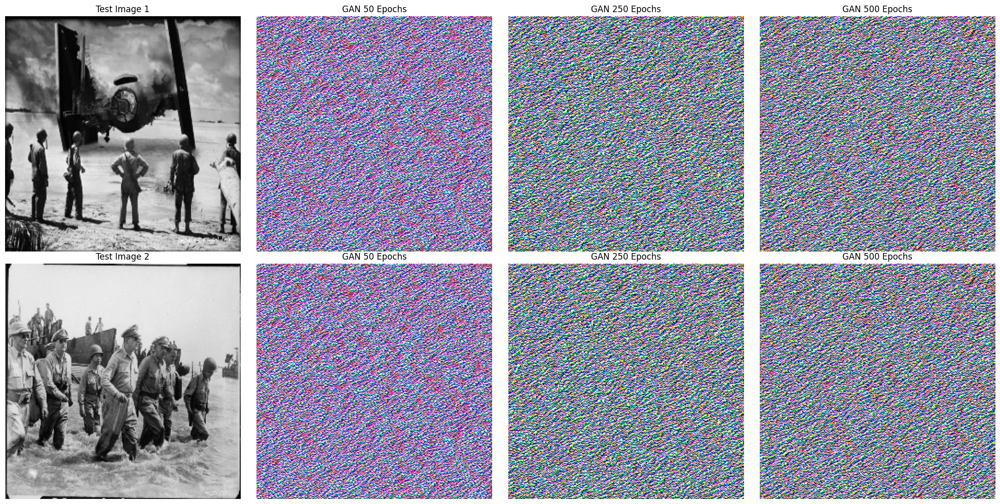

In [ ]:
import numpy as np
from keras.models import load_model
import matplotlib.pyplot as plt
import cv2

models = {
    'GAN 50 Epochs': drive_path + 'gan_generator(50).h5',
    'GAN 250 Epochs': drive_path + 'gan_generator(250).h5',
    'GAN 500 Epochs': drive_path + 'gan_generator(500).h5'
}

# 테스트 이미지 경로 설정
test_image_paths = {
    'Test Image 1': drive_path + 'test_photo_before1.jpg',
    'Test Image 2': drive_path + 'test_photo_before2.jpg'
}

# 모델 로드
loaded_models = {name: load_model(path, compile=False) for name, path in models.items()}

# 잡음 벡터 생성 함수
def generate_noise(noise_dim=100):
    return np.random.normal(0, 1, size=(1, noise_dim))

# 결과 시각화
n_cols = len(models) + 1
n_rows = len(test_image_paths)
plt.figure(figsize=(20, n_rows * 5))

# 원본 흑백 이미지 로드 및 표시
for i, (image_name, image_path) in enumerate(test_image_paths.items()):
    original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    original_image = cv2.resize(original_image, (256, 256))
    plt.subplot(n_rows, n_cols, i * n_cols + 1)
    plt.imshow(original_image, cmap='gray')
    plt.title(image_name)
    plt.axis('off')

# 각 모델의 예측 이미지 생성 및 표시
for i, (model_name, model) in enumerate(loaded_models.items()):
    noise = generate_noise()  # 모델 입력으로 사용할 잡음 벡터 생성
    prediction = model.predict(noise)[0]
    prediction = (prediction * 127.5 + 127.5).astype('uint8')  # [0, 255] 범위로 조정

    # 각 테스트 이미지에 대해 예측 이미지 표시
    for j in range(n_rows):
        plt.subplot(n_rows, n_cols, j * n_cols + i + 2)
        plt.imshow(prediction)
        plt.title(f"{model_name}")
        plt.axis('off')

plt.tight_layout()
plt.show()